In [ ]:
!pip install fathomnet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.9/50.9 kB 2.3 MB/s eta 0:00:00


In [ ]:
from fathomnet.api import xapikey, images, boundingboxes, taxa

CONCEPT = 'Grimpoteuthis'
fathomnet_image_list = images.find_by_concept(CONCEPT)
print(f"Found {len(fathomnet_image_list)} images for '{CONCEPT}'")
for img in fathomnet_image_list[:5]:
    print(f"- {img.uuid}: {img.url}")

Found 15 images for 'Grimpoteuthis'
- abfdb62f-908e-42b9-ba49-1a755324cdc4: https://oer.hpc.msstate.edu/FathomNet/BenthicAnimalGuide_training/Cephalopoda012_trimmed.png
- 82f43b9c-e054-419b-b083-7c18c3eba74e: https://oer.hpc.msstate.edu/FathomNet/BenthicAnimalGuide_training/Cephalopoda013_trimmed.png
- 1c5b06ca-476b-409e-9d71-f5a3620e55b7: https://oer.hpc.msstate.edu/FathomNet/BenthicAnimalGuide_training/Cephalopoda010_trimmed.png
- 703c8135-9683-4f5a-8fa7-c57141c8ede1: https://oer.hpc.msstate.edu/FathomNet/BenthicAnimalGuide_training/Cephalopoda011_trimmed.png
- 0f5ab26a-bbaa-4d00-bb7e-4e7b1b068627: https://oer.hpc.msstate.edu/FathomNet/BenthicAnimalGuide_training/Cephalopoda014_trimmed.png


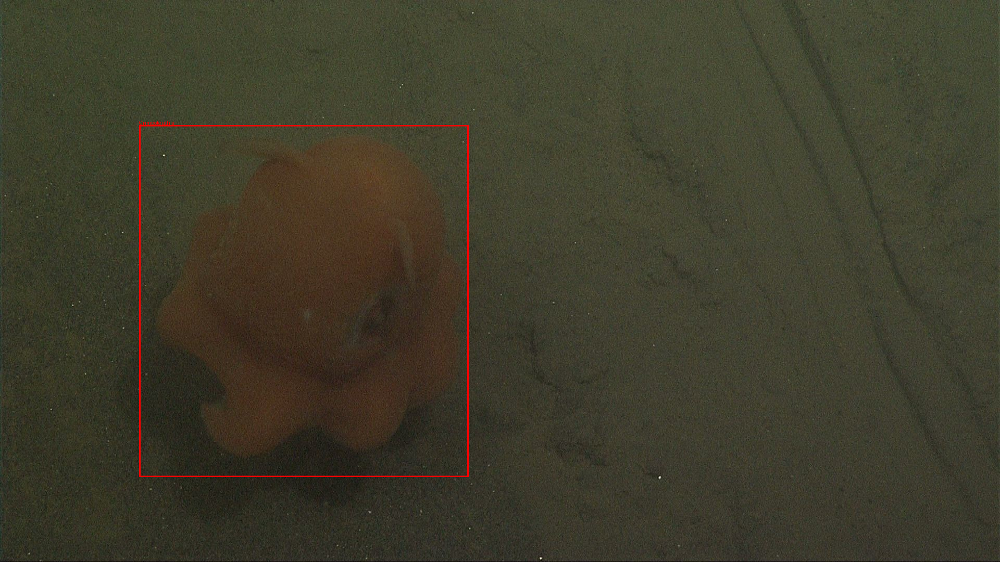

In [ ]:
from IPython.display import display
from PIL import Image, ImageDraw
import requests
from io import BytesIO

for img in fathomnet_image_list[11:12]:
    response = requests.get(img.url)
    pil_img = Image.open(BytesIO(response.content)).convert("RGB")
    pil_img_copy = pil_img.copy()
    draw = ImageDraw.Draw(pil_img)
    for box in img.boundingBoxes:
        if box.concept != CONCEPT:
            continue
        x, y = box.x, box.y
        w, h = box.width, box.height
        concept = box.concept

        draw.rectangle([x, y, x + w, y + h], outline="red", width=3)
        draw.text((x, y - 10), concept, fill="red")

    display(pil_img)


In [ ]:
from typing_extensions import Self
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import math
import cv2
import torch.fft as fft

def inv_mag(x):
  fft_ = torch.fft.fft2(x)
  fft_ = torch.fft.ifft2(1*torch.exp(1j*(fft_.angle())))
  return fft_.real


class MDTA(nn.Module):
    def __init__(self, channels, num_heads):
        super(MDTA, self).__init__()
        self.num_heads = num_heads
        self.temperature = nn.Parameter(torch.ones(1, num_heads, 1, 1))
        self.qkv = nn.Conv2d(channels, channels * 3, kernel_size=1, bias=False)
        self.qkv_conv = nn.Conv2d(channels * 3, channels * 3, kernel_size=3, padding=1, groups=channels * 3, bias=False)
        self.project_out = nn.Conv2d(channels, channels, kernel_size=1, bias=False)

        #frequency

        self.kv = nn.Conv2d(channels, channels * 2, kernel_size=1, bias=False)
        self.q1X1_1 = nn.Conv2d(channels, channels , kernel_size=1, bias=False)
        self.q1X1_2 = nn.Conv2d(channels, channels , kernel_size=1, bias=False)
        self.kv_conv = nn.Conv2d(channels * 2, channels * 2, kernel_size=3, padding=1, groups=channels * 2, bias=False)
        self.project_outf = nn.Conv2d(channels, channels, kernel_size=1, bias=False)



    def forward(self, x):
        b, c, h, w = x.shape
        q, k, v = self.qkv_conv(self.qkv(x)).chunk(3, dim=1)
        q = q.reshape(b, self.num_heads, -1, h * w)
        k = k.reshape(b, self.num_heads, -1, h * w)
        v = v.reshape(b, self.num_heads, -1, h * w)
        q, k = F.normalize(q, dim=-1), F.normalize(k, dim=-1)
        attn = torch.softmax(torch.matmul(q, k.transpose(-2, -1).contiguous()) * self.temperature, dim=-1)
        out = self.project_out(torch.matmul(attn, v).reshape(b, -1, h, w))

        # frequency

        x_fft = fft.fftn(x, dim=(-2, -1)).real
        x_fft1=self.q1X1_1(x_fft)
        x_fft2=F.gelu(x_fft1)
        x_fft3=self.q1X1_2(x_fft2)
        qf=fft.ifftn(x_fft3,dim=(-2, -1)).real


        kf, vf = self.kv_conv(self.kv(out)).chunk(2, dim=1)
        qf = qf.reshape(b, self.num_heads, -1, h * w)
        kf = kf.reshape(b, self.num_heads, -1, h * w)
        vf = vf.reshape(b, self.num_heads, -1, h * w)
        qf, kf = F.normalize(qf, dim=-1), F.normalize(kf, dim=-1)
        attnf = torch.softmax(torch.matmul(qf, k.transpose(-2, -1).contiguous()) * self.temperature, dim=-1)
        outf = self.project_outf(torch.matmul(attn, vf).reshape(b, -1, h, w))
        return outf


class GDFN(nn.Module):
    def __init__(self, channels, expansion_factor):
        super(GDFN, self).__init__()

        hidden_channels = int(channels * expansion_factor)
        self.project_in = nn.Conv2d(channels, hidden_channels * 2, kernel_size=1, bias=False)
        self.conv = nn.Conv2d(hidden_channels * 2, hidden_channels * 2, kernel_size=3, padding=1,
                              groups=hidden_channels * 2, bias=False)
        self.project_out = nn.Conv2d(hidden_channels, channels, kernel_size=1, bias=False)

    def forward(self, x):
        x1, x2 = self.conv(self.project_in(x)).chunk(2, dim=1)
        x = self.project_out(F.gelu(x1) * x2)
        return x




class TransformerBlock(nn.Module):
    def __init__(self, channels, num_heads, expansion_factor):
        super(TransformerBlock, self).__init__()

        self.norm1 = nn.LayerNorm(channels)
        self.attn = MDTA(channels, num_heads)
        self.norm2 = nn.LayerNorm(channels)
        self.ffn = GDFN(channels, expansion_factor)

    def forward(self, x):
        b, c, h, w = x.shape
        x = x + self.attn(self.norm1(x.reshape(b, c, -1).transpose(-2, -1).contiguous()).transpose(-2, -1)
                          .contiguous().reshape(b, c, h, w))
        x = x + self.ffn(self.norm2(x.reshape(b, c, -1).transpose(-2, -1).contiguous()).transpose(-2, -1)
                         .contiguous().reshape(b, c, h, w))
        return x


class DownSample(nn.Module):
    def __init__(self, channels):
        super(DownSample, self).__init__()
        self.body = nn.Sequential(nn.Conv2d(channels, channels // 2, kernel_size=3, padding=1, bias=False),
                                  nn.PixelUnshuffle(2))

    def forward(self, x):
        return self.body(x)



class UpSample(nn.Module):
    def __init__(self, channels,channel_red):
        super(UpSample, self).__init__()

        self.amp_fuse = nn.Sequential(nn.Conv2d(channels,channels,1,1,0),nn.LeakyReLU(0.1,inplace=False),
                                      nn.Conv2d(channels,channels,1,1,0))
        self.pha_fuse = nn.Sequential(nn.Conv2d(channels,channels,1,1,0),nn.LeakyReLU(0.1,inplace=False),
                                      nn.Conv2d(channels,channels,1,1,0))
        if channel_red:
            self.post = nn.Conv2d(channels, channels//2, 1, 1, 0)

        else:
            self.post = nn.Conv2d(channels, channels, 1, 1, 0)


    def forward(self, x):
        N, C, H, W = x.shape
        fft_x = torch.fft.fft2(x)
        mag_x = torch.abs(fft_x)
        pha_x = torch.angle(fft_x)
        Mag = self.amp_fuse(mag_x)
        Pha = self.pha_fuse(pha_x)
        amp_fuse = torch.tile(Mag, (2, 2))
        pha_fuse = torch.tile(Pha, (2, 2))
        real = amp_fuse * torch.cos(pha_fuse)
        imag = amp_fuse * torch.sin(pha_fuse)
        out = torch.complex(real, imag)
        output = torch.fft.ifft2(out)
        output = torch.abs(output)
        return self.post(output)


class UpSample1(nn.Module):
    def __init__(self, channels):
        super(UpSample1, self).__init__()
        self.body = nn.Sequential(nn.Conv2d(channels, channels * 2, kernel_size=3, padding=1, bias=False),
                                  nn.PixelShuffle(2))

    def forward(self, x):
        return self.body(x)


class UpS(nn.Module):
    def __init__(self, channels):
        super(UpS, self).__init__()
        self.Fups=UpSample(channels,True)
        self.Sups=UpSample1(channels)
        self.reduce=nn.Conv2d(channels, channels // 2, kernel_size=1,bias=False)

    def forward(self, x):
        out=torch.cat([self.Fups(x),self.Sups(x)],dim=1)
        # print(out.shape)
        return self.reduce(out)


class mymodel(nn.Module):
    def __init__(self, num_blocks=[2, 3, 3, 4], num_heads=[1, 2, 4, 8], channels=[16, 32, 64, 128], num_refinement=4,
                 expansion_factor=2.66, ch=[64,32,16,64]):
        super(mymodel, self).__init__()

        self.embed_conv_rgb = nn.Conv2d(3, channels[0], kernel_size=3, padding=1, bias=False)
        self.encoders = nn.ModuleList([nn.Sequential(*[TransformerBlock(num_ch, num_ah, expansion_factor) for _ in range(num_tb)]) for num_tb, num_ah, num_ch in
                                       zip(num_blocks, num_heads, channels)])

        self.down1 = DownSample(channels[0])
        self.down2 = DownSample(channels[1])
        self.down3 = DownSample(channels[2])
        self.ups_1=UpS(128)
        self.ups_2=UpS(64)
        self.ups_3=UpS(32)
        self.ups_4=UpS(3)

        self.ups1 = UpSample1(32)
        self.reduces2 = nn.Conv2d(64, 32, kernel_size=1, bias=False)
        self.reduces1=nn.Conv2d(128, 64, kernel_size=1, bias=False)

        self.decoders = nn.ModuleList([nn.Sequential(*[TransformerBlock(channels[2], num_heads[2], expansion_factor)
                                                       for _ in range(num_blocks[2])])])
        self.decoders.append(nn.Sequential(*[TransformerBlock(channels[1], num_heads[1], expansion_factor)
                                             for _ in range(num_blocks[1])]))

        self.decoders.append(nn.Sequential(*[TransformerBlock(channels[1], num_heads[0], expansion_factor) for _ in range(num_blocks[0])]))

        self.refinement = nn.Sequential(*[TransformerBlock(channels[1], num_heads[0], expansion_factor)
                                          for _ in range(num_refinement)])
        self.output = nn.Conv2d(8, 3, kernel_size=3, padding=1, bias=False)
        self.output1= nn.Conv2d(16, 8, kernel_size=3, padding=1, bias=False)

        self.ups2 = UpSample1(16)
        self.outputl=nn.Conv2d(32, 8, kernel_size=3, padding=1, bias=False)

    def forward(self,RGB_input):
        ###-------encoder for RGB-------####
        fo_rgb = self.embed_conv_rgb(RGB_input)
        out_enc_rgb1 = self.encoders[0](fo_rgb)
        out_enc_rgb2 = self.encoders[1](self.down1(out_enc_rgb1))
        # print(out_enc_rgb2.shape)

        out_enc_rgb3 = self.encoders[2](self.down2(out_enc_rgb2))
        # print(out_enc_rgb3.shape)
        out_enc_rgb4 = self.encoders[3](self.down3(out_enc_rgb3))
        # print(out_enc_rgb4.shape)

        ###-------Dencoder------###
        out_dec3 = self.decoders[0](self.reduces1(torch.cat([(self.ups_1(out_enc_rgb4)), out_enc_rgb3], dim=1)))
        # print(out_dec3.shape)
        out_dec2 = self.decoders[1](self.reduces2(torch.cat([self.ups_2(out_dec3),out_enc_rgb2], dim=1)))
        # print(out_dec2.shape)
        fd = self.decoders[2](torch.cat([self.ups_3(out_dec2),out_enc_rgb1], dim=1))
        # print(fd.shape)
        # print('lasst',fd_FP.shape)
        fr = self.refinement(fd)
        return self.output(self.outputl(fr))

In [ ]:
import torch
import torch.nn as nn
from torchvision import transforms
from PIL import Image
import requests
from io import BytesIO
import os

model_path = '/content/drive/MyDrive/GSOC/Models/best.pth'  # full model (not state_dict)
image_urls = [img.url for img in fathomnet_image_list]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = mymodel()
model.load_state_dict(torch.load(model_path))
model.to(device)
model.eval()

sr_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

image_list = []
enhanced_list = []

for idx, url in enumerate(image_urls):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content)).convert('RGB')
    image_list.append(img)

    input_tensor = sr_transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(input_tensor)[0]
        output = output.detach().squeeze(0).cpu()

    enhanced_img = transforms.ToPILImage()(output.clamp(-1, 1) * 0.5 + 0.5)
    enhanced_list.append(enhanced_img)




In [ ]:
for i, img in enumerate(enhanced_list):
  display(enhanced_list[i])
  display(image_list[i])
  print("\n\n\n\n")

In [ ]:
import cv2
import numpy as np
import torch
from torchvision import transforms
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt


# --- Scoring functions ---
def score_darkness(crop):
    gray = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
    return np.mean(gray)

def score_sharpness(crop):
    gray = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
    return cv2.Laplacian(gray, cv2.CV_64F).var()

def score_contrast(crop):
    gray = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
    return gray.std()

def score_crop_quality(crop, weights=(0.2, 0.3, 0.5)):
    if crop.size == 0:
        return 0.0
    brightness = score_darkness(crop)
    sharpness = score_sharpness(crop)
    contrast = score_contrast(crop)

    brightness_score = min(max((brightness - 30) / (255 - 30), 0), 1)
    sharpness_score = min(sharpness / 300.0, 1.0)
    contrast_score = min(contrast / 60.0, 1.0)

    return weights[0] * brightness_score + weights[1] * sharpness_score + weights[2] * contrast_score

# --- Main logic ---
def get_best_crops_from_sr_images(metadata_list, edge_margin=0, concept=None, debug_idx=-1):
    best_results = []

    for img_idx, metadata in enumerate(metadata_list):
        img_width, img_height = metadata['width'], metadata['height']

        try:
            response = requests.get(metadata['url'])
            response.raise_for_status()
            img_array = np.asarray(bytearray(response.content), dtype=np.uint8)
            original_img = cv2.imdecode(img_array, cv2.IMREAD_COLOR)
            if original_img is None:
                continue
        except Exception as e:
            print(f"Failed to fetch {metadata['url']}: {e}")
            continue

        pil_img = Image.fromarray(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        input_tensor = sr_transform(pil_img).unsqueeze(0).to(device)
        with torch.no_grad():
            sr_tensor = model(input_tensor)[0].detach().cpu()
        sr_img = transforms.ToPILImage()(sr_tensor.clamp(-1, 1) * 0.5 + 0.5)
        sr_img = np.array(sr_img)
        sr_img = cv2.resize(sr_img, (original_img.shape[1], original_img.shape[0]), interpolation=cv2.INTER_CUBIC)
        sr_img = cv2.cvtColor(sr_img, cv2.COLOR_RGB2BGR)

        debug_image = original_img.copy()

        for box_idx, box in enumerate(metadata['bounding_box']):
            if concept is not None and box.concept != concept:
                continue

            x, y, w, h = box.x, box.y, box.width, box.height

            # Boundary check
            if (
                x <= edge_margin or y <= edge_margin or
                (x + w) >= (img_width - edge_margin) or
                (y + h) >= (img_height - edge_margin)
            ):
                continue

            x1, y1 = max(0, x), max(0, y)
            x2, y2 = min(img_width, x + w), min(img_height, y + h)

            # ✅ Correct crop slicing order: [y1:y2, x1:x2]
            crop_orig = original_img[y1:y2, x1:x2]
            crop_sr   = sr_img[y1:y2, x1:x2]

            display(crop_orig)
            display(crop_sr)

            score_orig = score_crop_quality(crop_orig)
            score_sr   = score_crop_quality(crop_sr)

            # Debugging: draw bounding box and show for first image only
            if img_idx == debug_idx:
                cv2.rectangle(debug_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(debug_image, f"Box {box_idx}", (x1, y1 - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

            # Choose better crop
            best_crop = crop_sr if score_sr > score_orig else crop_orig
            best_crop = cv2.cvtColor(best_crop, cv2.COLOR_BGR2RGB)
            best_score = max(score_sr, score_orig)
            best_results.append((best_score, best_crop))

        # Show debug image with all bounding boxes for the first image
        if img_idx == debug_idx:
            plt.figure(figsize=(10, 10))
            plt.imshow(cv2.cvtColor(debug_image, cv2.COLOR_BGR2RGB))
            plt.title("Debug: Bounding Boxes on First Image")
            plt.axis('off')
            plt.show()

    return sorted(best_results, key=lambda x: x[0], reverse=True)

array([[[18, 12,  7],
        [18, 12,  7],
        [18, 12,  7],
        ...,
        [18, 12,  7],
        [18, 12,  7],
        [19, 13,  8]],

       [[18, 12,  7],
        [18, 12,  7],
        [18, 12,  7],
        ...,
        [18, 12,  7],
        [18, 12,  7],
        [19, 13,  8]],

       [[18, 12,  7],
        [18, 12,  7],
        [16, 12,  7],
        ...,
        [20, 11,  7],
        [18, 12,  7],
        [18, 12,  7]],

       ...,

       [[21, 12,  8],
        [21, 12,  8],
        [21, 12,  8],
        ...,
        [19, 10,  6],
        [20, 11,  7],
        [20, 11,  7]],

       [[21, 12,  8],
        [21, 12,  8],
        [21, 12,  8],
        ...,
        [20, 11,  7],
        [20, 11,  7],
        [20, 11,  7]],

       [[21, 12,  8],
        [20, 11,  7],
        [20, 11,  7],
        ...,
        [20, 11,  7],
        [20, 11,  7],
        [20, 11,  7]]], dtype=uint8)

array([[[27, 30, 33],
        [27, 30, 32],
        [27, 30, 32],
        ...,
        [30, 28, 32],
        [30, 28, 32],
        [30, 28, 32]],

       [[27, 30, 35],
        [27, 30, 34],
        [26, 30, 34],
        ...,
        [31, 29, 34],
        [31, 29, 34],
        [31, 29, 34]],

       [[27, 30, 36],
        [27, 29, 35],
        [27, 29, 35],
        ...,
        [32, 28, 36],
        [32, 28, 35],
        [31, 28, 35]],

       ...,

       [[35, 31, 39],
        [35, 31, 39],
        [35, 31, 39],
        ...,
        [33, 28, 37],
        [33, 28, 37],
        [33, 28, 37]],

       [[35, 31, 39],
        [34, 30, 38],
        [34, 30, 38],
        ...,
        [34, 28, 37],
        [33, 28, 37],
        [33, 28, 37]],

       [[34, 30, 38],
        [34, 30, 38],
        [34, 29, 37],
        ...,
        [34, 28, 36],
        [34, 28, 36],
        [34, 28, 36]]], dtype=uint8)

array([[[107,  97,  80],
        [218, 207, 179],
        [176, 163, 141],
        ...,
        [172, 187, 143],
        [173, 187, 145],
        [156, 169, 125]],

       [[ 57,  46,  32],
        [ 89,  74,  48],
        [112,  95,  76],
        ...,
        [203, 219, 166],
        [193, 208, 157],
        [162, 178, 125]],

       [[ 60,  46,  34],
        [ 44,  27,   6],
        [ 29,  10,   0],
        ...,
        [190, 203, 149],
        [157, 167, 120],
        [110, 120,  73]],

       ...,

       [[107, 114,  79],
        [180, 194, 158],
        [225, 241, 207],
        ...,
        [179, 201, 152],
        [186, 208, 160],
        [207, 229, 180]],

       [[187, 191, 149],
        [220, 227, 192],
        [246, 254, 223],
        ...,
        [198, 220, 171],
        [198, 220, 171],
        [198, 220, 171]],

       [[133, 133,  97],
        [116, 118,  88],
        [148, 151, 126],
        ...,
        [215, 240, 190],
        [205, 230, 180],
        [195, 220, 170]]], dtype=uint8)
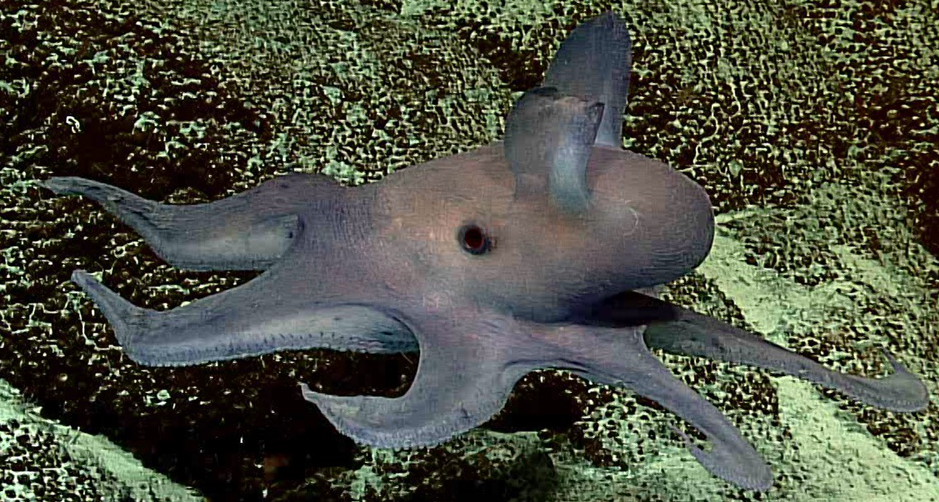

array([[[ 95,  89,  75],
        [ 97,  92,  79],
        [ 98,  94,  81],
        ...,
        [153, 157, 141],
        [158, 161, 147],
        [159, 163, 149]],

       [[ 89,  82,  69],
        [ 89,  83,  70],
        [ 89,  83,  70],
        ...,
        [186, 188, 173],
        [191, 194, 181],
        [191, 195, 181]],

       [[ 78,  72,  60],
        [ 77,  70,  58],
        [ 75,  69,  56],
        ...,
        [198, 199, 184],
        [202, 204, 190],
        [199, 202, 188]],

       ...,

       [[149, 165, 172],
        [159, 174, 181],
        [171, 184, 191],
        ...,
        [217, 227, 227],
        [220, 230, 229],
        [222, 232, 230]],

       [[152, 167, 171],
        [157, 170, 174],
        [163, 175, 180],
        ...,
        [216, 228, 228],
        [220, 231, 231],
        [222, 232, 232]],

       [[141, 155, 157],
        [141, 153, 155],
        [142, 153, 155],
        ...,
        [217, 228, 229],
        [220, 230, 231],
        [221, 232, 232]]], dtype=uint8)
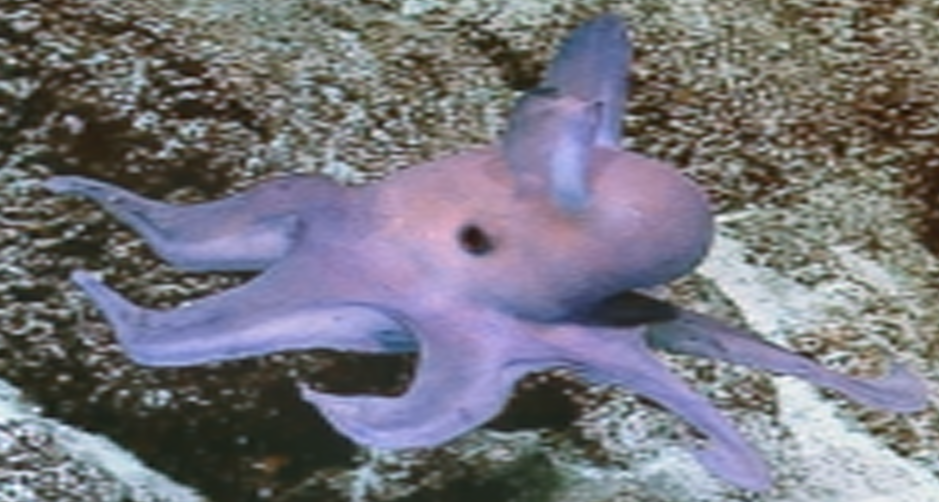

array([[[ 56,  18,   6],
        [ 55,  17,   5],
        [ 53,  15,   3],
        ...,
        [115,  71,  10],
        [114,  71,   8],
        [112,  70,   5]],

       [[ 55,  18,   4],
        [ 55,  17,   5],
        [ 53,  15,   3],
        ...,
        [116,  72,   9],
        [117,  73,   9],
        [116,  72,   8]],

       [[ 54,  17,   3],
        [ 54,  16,   4],
        [ 53,  15,   3],
        ...,
        [116,  72,   9],
        [119,  75,  11],
        [119,  76,   9]],

       ...,

       [[ 82,  40,   3],
        [ 84,  42,   5],
        [ 85,  44,   5],
        ...,
        [133,  97,  13],
        [126,  89,   7],
        [126,  89,   9]],

       [[ 85,  43,   6],
        [ 89,  47,  10],
        [ 89,  48,   9],
        ...,
        [131,  94,  12],
        [124,  87,   7],
        [122,  84,   6]],

       [[ 88,  46,   9],
        [ 92,  50,  13],
        [ 88,  49,  11],
        ...,
        [126,  89,   5],
        [121,  84,   4],
        [120,  83,   3]]], dtype=uint8)
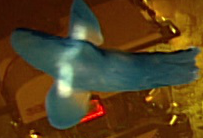

array([[[ 88,  65,  46],
        [ 88,  65,  46],
        [ 87,  64,  46],
        ...,
        [161, 155, 105],
        [163, 157, 107],
        [164, 159, 108]],

       [[ 88,  65,  46],
        [ 87,  65,  46],
        [ 87,  65,  46],
        ...,
        [163, 156, 106],
        [164, 158, 108],
        [165, 159, 109]],

       [[ 88,  65,  47],
        [ 87,  65,  47],
        [ 87,  65,  46],
        ...,
        [164, 158, 107],
        [165, 159, 108],
        [165, 160, 109]],

       ...,

       [[126, 117,  80],
        [126, 117,  81],
        [126, 117,  81],
        ...,
        [192, 191, 139],
        [189, 189, 136],
        [186, 187, 133]],

       [[126, 117,  81],
        [126, 117,  82],
        [126, 117,  82],
        ...,
        [190, 190, 137],
        [188, 189, 135],
        [186, 187, 133]],

       [[126, 117,  82],
        [126, 117,  83],
        [126, 117,  83],
        ...,
        [189, 190, 136],
        [188, 189, 135],
        [186, 188, 133]]], dtype=uint8)
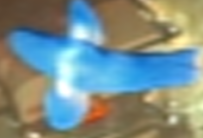

array([[[ 17,   3,   0],
        [ 18,   6,   0],
        [ 15,   4,   0],
        ...,
        [ 23,  14,  11],
        [ 12,   8,  14],
        [  8,   2,   7]],

       [[ 19,  13,   8],
        [ 12,   9,   1],
        [  7,   6,   0],
        ...,
        [  6,   7,   3],
        [  0,   2,   3],
        [  0,   1,   0]],

       [[  2,   2,   0],
        [  0,   3,   0],
        [  0,   7,   0],
        ...,
        [  0,   3,   0],
        [  0,   7,   3],
        [  0,   4,   0]],

       ...,

       [[217, 255, 255],
        [217, 254, 250],
        [223, 255, 251],
        ...,
        [151, 176, 166],
        [ 73, 103,  92],
        [ 56,  81,  71]],

       [[206, 255, 255],
        [211, 255, 253],
        [221, 255, 251],
        ...,
        [107, 134, 124],
        [ 56,  81,  71],
        [ 34,  53,  44]],

       [[186, 253, 246],
        [192, 249, 241],
        [201, 244, 235],
        ...,
        [ 74,  98,  88],
        [ 86, 105,  96],
        [119, 127, 120]]], dtype=uint8)
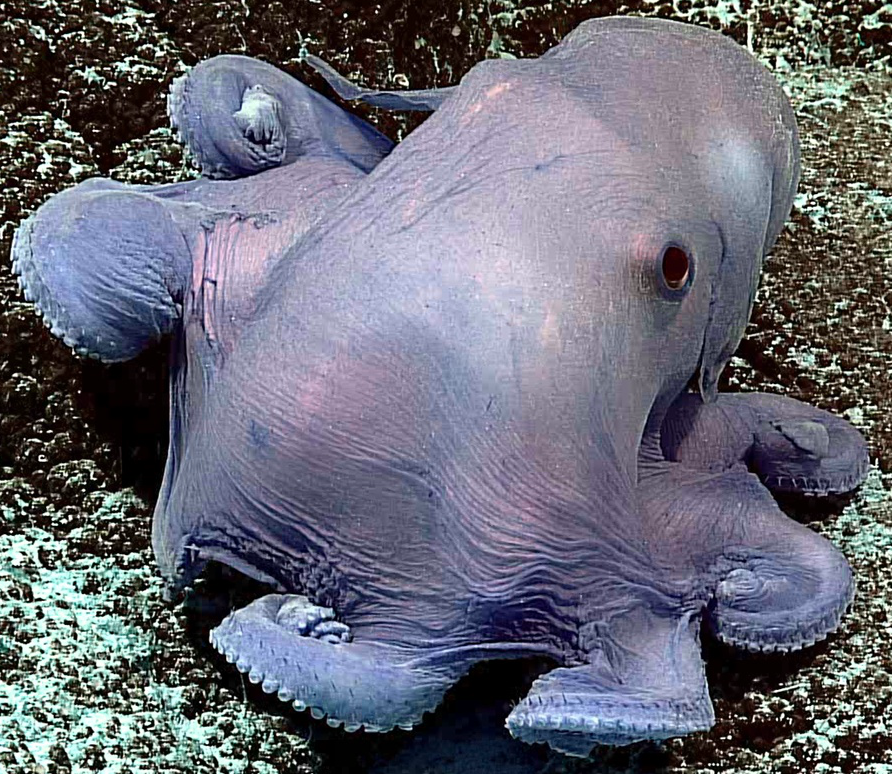

array([[[ 26,  15,   9],
        [ 25,  15,   9],
        [ 25,  16,  10],
        ...,
        [ 48,  56,  54],
        [ 46,  54,  52],
        [ 46,  54,  52]],

       [[ 33,  24,  19],
        [ 32,  25,  20],
        [ 32,  26,  21],
        ...,
        [ 64,  75,  75],
        [ 61,  73,  73],
        [ 60,  72,  71]],

       [[ 49,  42,  38],
        [ 49,  43,  40],
        [ 49,  44,  41],
        ...,
        [ 87, 102, 103],
        [ 86, 101, 102],
        [ 85,  99, 100]],

       ...,

       [[203, 237, 250],
        [199, 232, 246],
        [194, 226, 241],
        ...,
        [124, 153, 154],
        [113, 141, 142],
        [103, 131, 131]],

       [[196, 232, 243],
        [193, 228, 241],
        [189, 223, 236],
        ...,
        [128, 154, 157],
        [117, 143, 145],
        [108, 134, 135]],

       [[188, 226, 236],
        [185, 223, 233],
        [181, 218, 230],
        ...,
        [142, 165, 170],
        [134, 157, 162],
        [126, 150, 154]]], dtype=uint8)
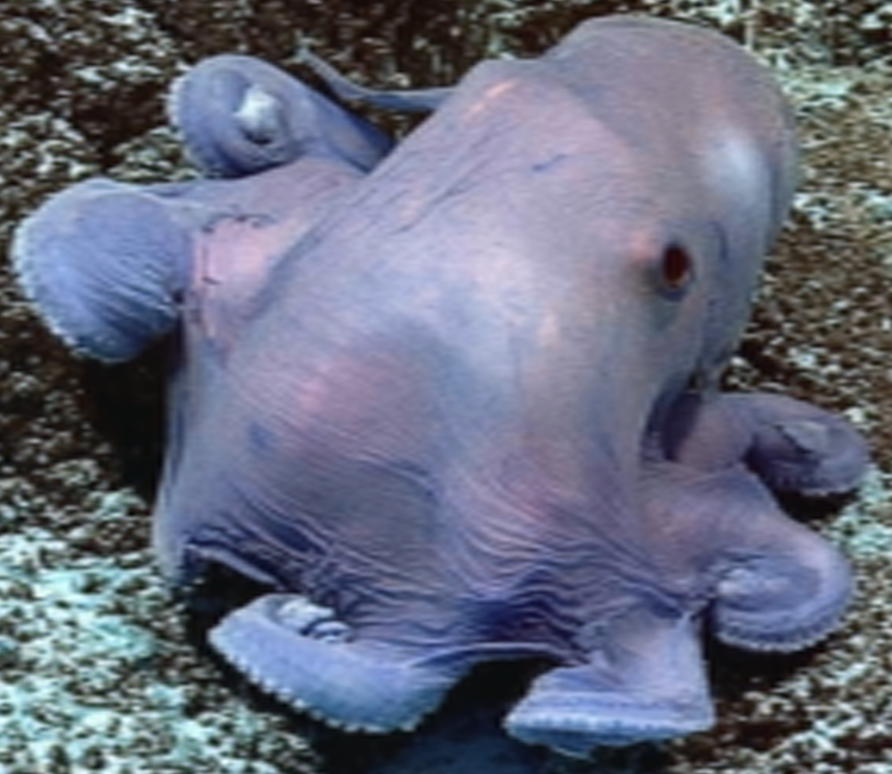

array([[[58, 49, 25],
        [58, 49, 25],
        [58, 49, 33],
        ...,
        [58, 53, 33],
        [58, 49, 25],
        [58, 49, 25]],

       [[58, 49, 25],
        [58, 49, 25],
        [58, 49, 33],
        ...,
        [58, 53, 33],
        [58, 49, 25],
        [58, 49, 25]],

       [[58, 53, 25],
        [58, 49, 33],
        [58, 49, 33],
        ...,
        [58, 49, 33],
        [58, 49, 33],
        [58, 53, 25]],

       ...,

       [[58, 53, 33],
        [58, 49, 33],
        [66, 53, 33],
        ...,
        [58, 49, 25],
        [58, 49, 25],
        [58, 49, 33]],

       [[58, 53, 33],
        [58, 49, 33],
        [66, 53, 33],
        ...,
        [58, 53, 25],
        [58, 49, 25],
        [58, 49, 25]],

       [[58, 53, 33],
        [66, 53, 33],
        [58, 53, 33],
        ...,
        [58, 53, 25],
        [58, 49, 25],
        [58, 53, 25]]], dtype=uint8)
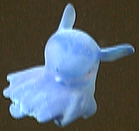

array([[[132, 136, 119],
        [132, 138, 120],
        [132, 138, 121],
        ...,
        [133, 140, 124],
        [133, 139, 123],
        [133, 138, 122]],

       [[132, 137, 120],
        [132, 138, 121],
        [132, 138, 121],
        ...,
        [134, 140, 124],
        [133, 139, 123],
        [132, 137, 121]],

       [[133, 138, 122],
        [132, 138, 122],
        [131, 137, 121],
        ...,
        [135, 140, 124],
        [134, 139, 123],
        [132, 138, 121]],

       ...,

       [[128, 133, 118],
        [129, 133, 118],
        [128, 132, 116],
        ...,
        [126, 129, 108],
        [126, 130, 109],
        [127, 131, 111]],

       [[127, 133, 116],
        [129, 135, 117],
        [128, 133, 116],
        ...,
        [126, 129, 107],
        [126, 130, 109],
        [126, 130, 110]],

       [[127, 133, 115],
        [129, 135, 116],
        [129, 134, 116],
        ...,
        [129, 131, 109],
        [128, 131, 109],
        [128, 132, 111]]], dtype=uint8)
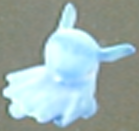

array([[[85, 89, 60],
        [84, 88, 59],
        [83, 87, 58],
        ...,
        [82, 85, 59],
        [83, 86, 60],
        [83, 86, 60]],

       [[86, 90, 61],
        [84, 88, 59],
        [83, 87, 58],
        ...,
        [84, 87, 61],
        [84, 87, 61],
        [83, 86, 60]],

       [[82, 86, 57],
        [84, 88, 59],
        [86, 90, 61],
        ...,
        [86, 89, 63],
        [87, 90, 64],
        [88, 91, 65]],

       ...,

       [[74, 76, 47],
        [76, 77, 51],
        [78, 80, 51],
        ...,
        [72, 71, 50],
        [75, 74, 53],
        [79, 78, 57]],

       [[73, 76, 50],
        [75, 78, 53],
        [77, 80, 54],
        ...,
        [72, 71, 50],
        [77, 76, 55],
        [82, 81, 60]],

       [[71, 74, 49],
        [73, 75, 53],
        [76, 79, 54],
        ...,
        [74, 73, 52],
        [77, 76, 55],
        [79, 78, 57]]], dtype=uint8)
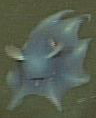

array([[[176, 173, 165],
        [176, 172, 165],
        [175, 172, 164],
        ...,
        [164, 161, 153],
        [164, 161, 152],
        [163, 160, 152]],

       [[176, 173, 166],
        [175, 172, 165],
        [175, 172, 164],
        ...,
        [165, 162, 154],
        [165, 162, 154],
        [164, 161, 153]],

       [[176, 173, 167],
        [175, 173, 166],
        [174, 172, 165],
        ...,
        [165, 162, 154],
        [165, 162, 154],
        [165, 161, 154]],

       ...,

       [[136, 132, 128],
        [139, 134, 131],
        [142, 137, 134],
        ...,
        [139, 131, 133],
        [138, 129, 132],
        [138, 127, 130]],

       [[136, 131, 129],
        [139, 134, 132],
        [142, 137, 135],
        ...,
        [137, 129, 132],
        [137, 128, 130],
        [136, 126, 128]],

       [[137, 132, 130],
        [140, 134, 133],
        [143, 137, 137],
        ...,
        [136, 128, 131],
        [136, 126, 129],
        [135, 125, 127]]], dtype=uint8)
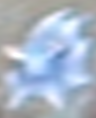

array([[[108, 126, 125],
        [113, 131, 130],
        [106, 124, 123],
        ...,
        [111, 120, 147],
        [109, 116, 143],
        [108, 115, 142]],

       [[110, 128, 127],
        [115, 133, 132],
        [108, 126, 125],
        ...,
        [108, 117, 144],
        [106, 113, 140],
        [104, 111, 138]],

       [[108, 126, 125],
        [108, 126, 125],
        [113, 131, 130],
        ...,
        [105, 114, 141],
        [105, 114, 141],
        [106, 115, 142]],

       ...,

       [[218, 228, 228],
        [218, 228, 228],
        [216, 228, 228],
        ...,
        [152, 159, 184],
        [151, 159, 182],
        [151, 159, 182]],

       [[216, 228, 228],
        [216, 228, 228],
        [216, 228, 228],
        ...,
        [155, 162, 187],
        [151, 159, 182],
        [148, 156, 179]],

       [[217, 229, 229],
        [217, 229, 229],
        [216, 230, 229],
        ...,
        [153, 160, 185],
        [150, 158, 181],
        [152, 160, 183]]], dtype=uint8)
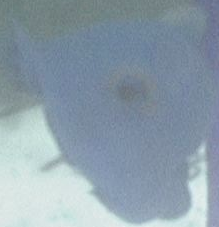

array([[[ 96, 101,  89],
        [ 96, 101,  89],
        [ 96, 101,  89],
        ...,
        [ 89,  83, 101],
        [ 89,  84, 101],
        [ 90,  84, 101]],

       [[ 95, 100,  88],
        [ 95, 100,  88],
        [ 95, 100,  88],
        ...,
        [ 89,  84, 102],
        [ 90,  84, 102],
        [ 90,  85, 101]],

       [[ 95, 100,  88],
        [ 95, 100,  88],
        [ 95, 100,  88],
        ...,
        [ 90,  84, 102],
        [ 90,  85, 102],
        [ 90,  85, 102]],

       ...,

       [[208, 223, 200],
        [207, 222, 200],
        [206, 222, 200],
        ...,
        [123, 128, 131],
        [124, 129, 132],
        [125, 129, 133]],

       [[206, 222, 200],
        [205, 222, 200],
        [205, 221, 199],
        ...,
        [124, 129, 132],
        [125, 129, 132],
        [126, 130, 133]],

       [[204, 221, 199],
        [204, 221, 199],
        [203, 221, 199],
        ...,
        [124, 130, 132],
        [125, 130, 132],
        [126, 130, 133]]], dtype=uint8)
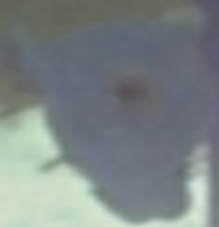

array([[[ 97, 118, 139],
        [ 96, 117, 138],
        [100, 121, 142],
        ...,
        [ 98, 121, 171],
        [ 95, 118, 168],
        [ 89, 112, 162]],

       [[103, 124, 145],
        [101, 122, 143],
        [101, 122, 143],
        ...,
        [ 99, 122, 172],
        [ 97, 120, 170],
        [ 89, 112, 162]],

       [[107, 127, 145],
        [105, 125, 143],
        [103, 125, 143],
        ...,
        [ 96, 119, 169],
        [ 95, 118, 168],
        [ 87, 110, 160]],

       ...,

       [[ 66,  78,  88],
        [ 73,  85,  95],
        [ 67,  79,  89],
        ...,
        [ 71,  83,  89],
        [ 73,  85,  91],
        [ 71,  83,  89]],

       [[ 67,  79,  89],
        [ 74,  86,  96],
        [ 68,  80,  90],
        ...,
        [ 70,  84,  90],
        [ 72,  86,  92],
        [ 71,  85,  91]],

       [[ 68,  80,  90],
        [ 68,  80,  90],
        [ 72,  84,  94],
        ...,
        [ 69,  83,  89],
        [ 70,  84,  90],
        [ 71,  85,  91]]], dtype=uint8)
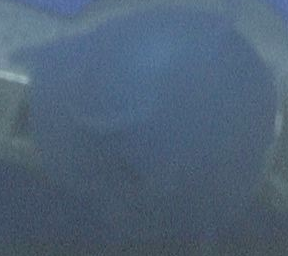

array([[[143, 134, 147],
        [139, 130, 145],
        [137, 128, 143],
        ...,
        [113, 112, 174],
        [114, 112, 176],
        [114, 112, 176]],

       [[150, 140, 151],
        [147, 137, 149],
        [144, 135, 148],
        ...,
        [113, 111, 174],
        [113, 112, 175],
        [113, 112, 176]],

       [[157, 146, 155],
        [154, 143, 153],
        [152, 141, 152],
        ...,
        [112, 111, 173],
        [113, 111, 174],
        [112, 111, 175]],

       ...,

       [[ 36,  22,  29],
        [ 35,  22,  29],
        [ 35,  22,  29],
        ...,
        [ 37,  20,  24],
        [ 37,  20,  24],
        [ 37,  21,  24]],

       [[ 36,  23,  29],
        [ 36,  23,  29],
        [ 36,  23,  29],
        ...,
        [ 37,  20,  24],
        [ 37,  21,  24],
        [ 38,  21,  24]],

       [[ 37,  24,  30],
        [ 37,  23,  30],
        [ 37,  23,  30],
        ...,
        [ 37,  20,  23],
        [ 38,  21,  24],
        [ 38,  21,  25]]], dtype=uint8)
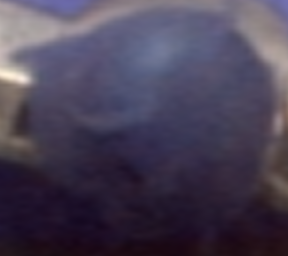

array([[[ 82, 105, 107],
        [ 77, 100, 102],
        [ 78, 101, 103],
        ...,
        [ 73,  97,  97],
        [ 78, 102, 102],
        [ 80, 104, 104]],

       [[ 80, 103, 105],
        [ 77, 100, 102],
        [ 80, 103, 105],
        ...,
        [ 74,  98,  98],
        [ 78, 102, 102],
        [ 81, 105, 105]],

       [[ 77, 100, 102],
        [ 73,  96,  98],
        [ 76,  99, 101],
        ...,
        [ 74,  98,  98],
        [ 77, 101, 101],
        [ 81, 105, 105]],

       ...,

       [[ 56,  77,  79],
        [ 53,  74,  76],
        [ 58,  79,  81],
        ...,
        [ 69,  79,  86],
        [ 73,  81,  88],
        [ 71,  81,  88]],

       [[ 60,  79,  82],
        [ 53,  72,  75],
        [ 48,  67,  70],
        ...,
        [ 73,  81,  88],
        [ 79,  85,  92],
        [ 76,  84,  91]],

       [[ 72,  87,  90],
        [ 66,  81,  84],
        [ 54,  71,  74],
        ...,
        [ 71,  77,  84],
        [ 77,  80,  88],
        [ 74,  80,  87]]], dtype=uint8)
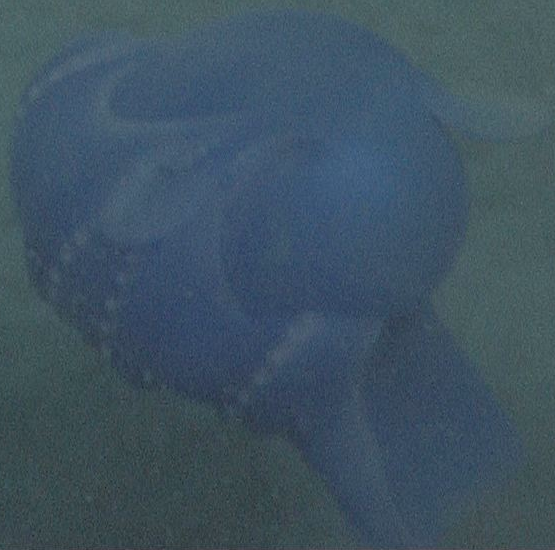

array([[[109, 111, 106],
        [109, 111, 106],
        [110, 111, 106],
        ...,
        [108, 107, 102],
        [108, 108, 102],
        [109, 109, 103]],

       [[109, 111, 106],
        [110, 111, 106],
        [110, 111, 106],
        ...,
        [108, 108, 102],
        [108, 108, 103],
        [109, 109, 103]],

       [[110, 111, 106],
        [110, 112, 106],
        [110, 112, 106],
        ...,
        [108, 108, 102],
        [108, 108, 103],
        [108, 109, 103]],

       ...,

       [[ 74,  69,  66],
        [ 75,  69,  67],
        [ 75,  69,  67],
        ...,
        [ 79,  75,  73],
        [ 79,  75,  72],
        [ 79,  74,  72]],

       [[ 81,  74,  64],
        [ 81,  74,  64],
        [ 82,  74,  64],
        ...,
        [ 85,  79,  70],
        [ 85,  79,  69],
        [ 85,  79,  69]],

       [[ 85,  77,  62],
        [ 85,  77,  63],
        [ 86,  77,  63],
        ...,
        [ 89,  81,  68],
        [ 89,  81,  67],
        [ 89,  81,  67]]], dtype=uint8)
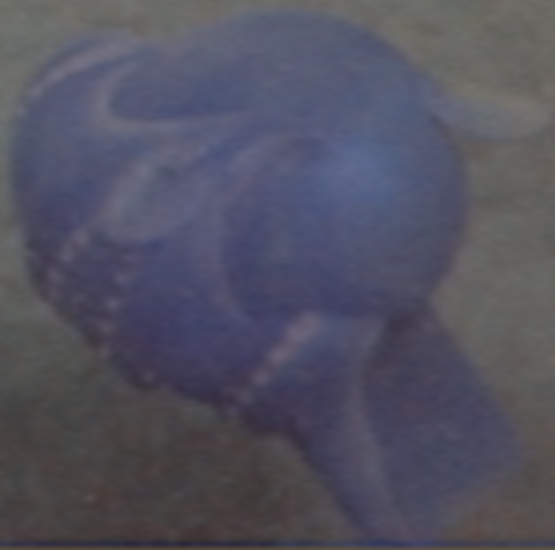

array([[[33, 56, 52],
        [44, 67, 63],
        [51, 76, 72],
        ...,
        [52, 73, 74],
        [43, 64, 65],
        [41, 62, 63]],

       [[31, 52, 49],
        [44, 67, 63],
        [48, 71, 67],
        ...,
        [49, 73, 73],
        [42, 66, 66],
        [42, 63, 65]],

       [[30, 51, 48],
        [47, 70, 66],
        [46, 69, 65],
        ...,
        [50, 71, 72],
        [44, 65, 66],
        [42, 63, 64]],

       ...,

       [[39, 52, 54],
        [38, 51, 53],
        [33, 50, 47],
        ...,
        [44, 58, 57],
        [43, 60, 57],
        [48, 65, 62]],

       [[35, 48, 50],
        [33, 46, 48],
        [31, 48, 45],
        ...,
        [42, 56, 55],
        [40, 57, 54],
        [45, 62, 59]],

       [[31, 44, 46],
        [29, 42, 44],
        [30, 46, 45],
        ...,
        [36, 50, 49],
        [36, 53, 50],
        [44, 61, 58]]], dtype=uint8)
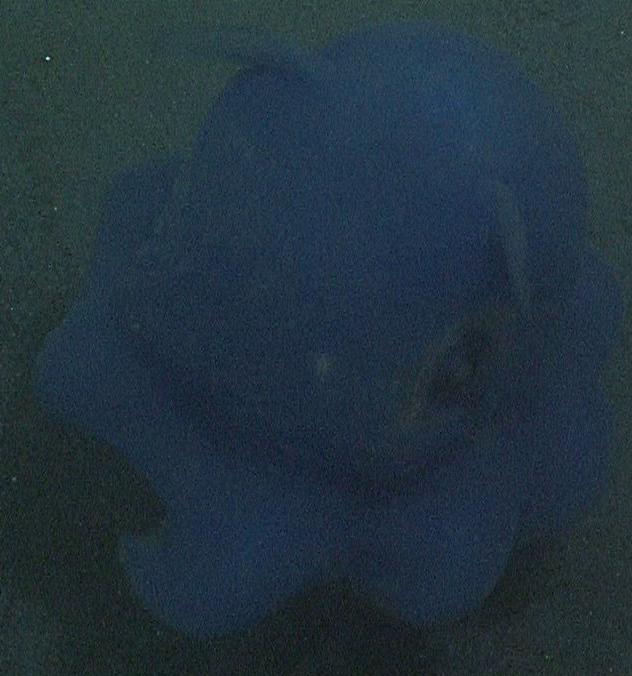

array([[[118, 103, 108],
        [118, 103, 108],
        [117, 102, 107],
        ...,
        [132, 111, 123],
        [132, 110, 123],
        [131, 109, 122]],

       [[117, 102, 106],
        [117, 102, 106],
        [116, 101, 106],
        ...,
        [132, 110, 123],
        [131, 110, 122],
        [130, 109, 121]],

       [[116, 101, 105],
        [116, 101, 106],
        [116, 101, 106],
        ...,
        [131, 110, 122],
        [131, 109, 121],
        [130, 108, 120]],

       ...,

       [[ 88,  64,  57],
        [ 88,  65,  58],
        [ 89,  65,  58],
        ...,
        [105,  76,  74],
        [105,  76,  75],
        [105,  76,  75]],

       [[ 88,  64,  58],
        [ 89,  65,  59],
        [ 90,  66,  60],
        ...,
        [107,  77,  75],
        [107,  77,  76],
        [107,  77,  77]],

       [[ 89,  65,  59],
        [ 90,  66,  60],
        [ 91,  67,  61],
        ...,
        [108,  78,  76],
        [109,  78,  77],
        [109,  79,  78]]], dtype=uint8)
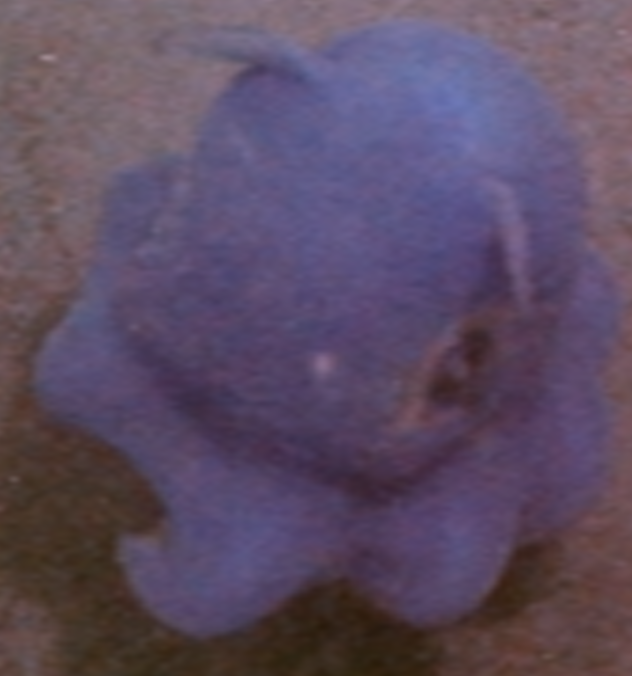

array([[[131, 169, 154],
        [131, 169, 154],
        [130, 166, 150],
        ...,
        [143, 188, 169],
        [141, 188, 171],
        [138, 186, 172]],

       [[128, 166, 153],
        [131, 167, 154],
        [131, 166, 152],
        ...,
        [142, 187, 168],
        [142, 188, 170],
        [139, 185, 168]],

       [[129, 165, 149],
        [134, 171, 153],
        [132, 170, 152],
        ...,
        [145, 188, 169],
        [147, 190, 172],
        [145, 190, 172]],

       ...,

       [[116, 151, 141],
        [115, 150, 141],
        [116, 151, 142],
        ...,
        [120, 165, 154],
        [122, 164, 155],
        [120, 159, 151]],

       [[116, 149, 142],
        [113, 147, 142],
        [113, 146, 137],
        ...,
        [123, 162, 154],
        [120, 160, 152],
        [124, 164, 157]],

       [[112, 149, 139],
        [112, 150, 139],
        [110, 150, 137],
        ...,
        [123, 162, 152],
        [124, 163, 153],
        [123, 164, 154]]], dtype=uint8)
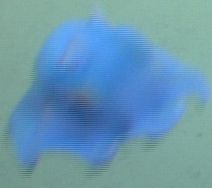

array([[[122, 127, 127],
        [122, 127, 127],
        [123, 127, 127],
        ...,
        [132, 152, 148],
        [133, 152, 148],
        [133, 152, 148]],

       [[123, 128, 127],
        [123, 128, 127],
        [123, 128, 128],
        ...,
        [132, 151, 148],
        [132, 151, 148],
        [132, 151, 148]],

       [[123, 128, 128],
        [123, 128, 128],
        [123, 128, 128],
        ...,
        [132, 151, 148],
        [132, 151, 148],
        [132, 151, 148]],

       ...,

       [[ 90,  88, 104],
        [ 90,  88, 104],
        [ 90,  88, 104],
        ...,
        [102, 108, 124],
        [102, 109, 124],
        [103, 110, 125]],

       [[ 90,  88, 104],
        [ 90,  88, 104],
        [ 90,  88, 105],
        ...,
        [102, 109, 124],
        [103, 109, 125],
        [103, 110, 125]],

       [[ 90,  88, 104],
        [ 90,  88, 104],
        [ 90,  88, 105],
        ...,
        [102, 109, 124],
        [103, 110, 125],
        [103, 110, 125]]], dtype=uint8)
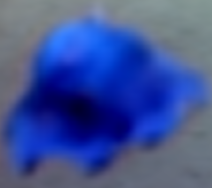

array([[[ 84,  68,  45],
        [ 86,  70,  47],
        [ 87,  71,  48],
        ...,
        [ 75,  59,  36],
        [ 88,  72,  49],
        [ 76,  59,  38]],

       [[ 79,  64,  41],
        [ 95,  80,  57],
        [106,  91,  68],
        ...,
        [ 82,  67,  44],
        [ 77,  62,  39],
        [ 73,  58,  36]],

       [[ 78,  63,  40],
        [ 81,  66,  43],
        [ 89,  74,  51],
        ...,
        [ 78,  63,  40],
        [ 70,  55,  32],
        [ 73,  58,  36]],

       ...,

       [[ 73,  60,  38],
        [ 74,  61,  39],
        [ 77,  64,  42],
        ...,
        [ 47,  39,  16],
        [ 63,  55,  32],
        [ 67,  59,  36]],

       [[ 71,  58,  36],
        [ 73,  60,  38],
        [ 75,  62,  40],
        ...,
        [ 62,  51,  29],
        [ 67,  56,  34],
        [ 62,  52,  28]],

       [[ 74,  61,  39],
        [ 77,  64,  42],
        [ 78,  65,  43],
        ...,
        [ 77,  66,  44],
        [ 70,  59,  37],
        [ 65,  55,  31]]], dtype=uint8)
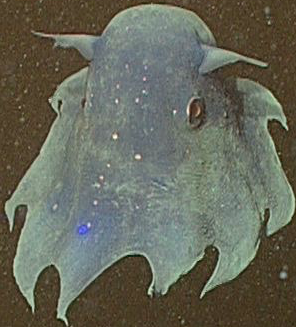

array([[[138, 143, 129],
        [136, 141, 126],
        [136, 140, 124],
        ...,
        [121, 120,  94],
        [121, 120,  94],
        [121, 120,  94]],

       [[140, 145, 130],
        [140, 145, 130],
        [141, 145, 129],
        ...,
        [120, 119,  94],
        [120, 119,  94],
        [120, 119,  94]],

       [[139, 144, 129],
        [140, 145, 129],
        [142, 146, 129],
        ...,
        [121, 121,  96],
        [121, 121,  97],
        [121, 121,  98]],

       ...,

       [[117, 119,  97],
        [116, 119,  98],
        [116, 119,  98],
        ...,
        [ 87,  94,  61],
        [ 88,  94,  61],
        [ 89,  95,  61]],

       [[118, 120,  99],
        [118, 121, 100],
        [118, 121, 100],
        ...,
        [ 89,  96,  63],
        [ 89,  96,  63],
        [ 90,  96,  62]],

       [[119, 121, 101],
        [119, 122, 101],
        [119, 123, 102],
        ...,
        [ 91,  97,  64],
        [ 91,  97,  64],
        [ 91,  97,  63]]], dtype=uint8)
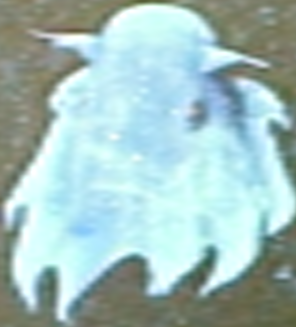

array([[[85, 68, 49],
        [78, 61, 42],
        [79, 62, 43],
        ...,
        [63, 45, 32],
        [81, 64, 48],
        [62, 45, 29]],

       [[77, 60, 41],
        [73, 56, 37],
        [76, 59, 40],
        ...,
        [67, 49, 36],
        [76, 59, 43],
        [68, 51, 35]],

       [[74, 58, 39],
        [68, 52, 33],
        [70, 54, 35],
        ...,
        [73, 56, 40],
        [67, 50, 34],
        [74, 57, 41]],

       ...,

       [[76, 62, 43],
        [65, 51, 32],
        [61, 47, 28],
        ...,
        [57, 45, 27],
        [41, 31, 13],
        [54, 44, 26]],

       [[76, 62, 43],
        [66, 52, 33],
        [63, 49, 30],
        ...,
        [50, 40, 22],
        [45, 35, 17],
        [55, 45, 27]],

       [[75, 61, 42],
        [70, 56, 37],
        [68, 54, 35],
        ...,
        [51, 41, 23],
        [49, 39, 21],
        [53, 43, 25]]], dtype=uint8)
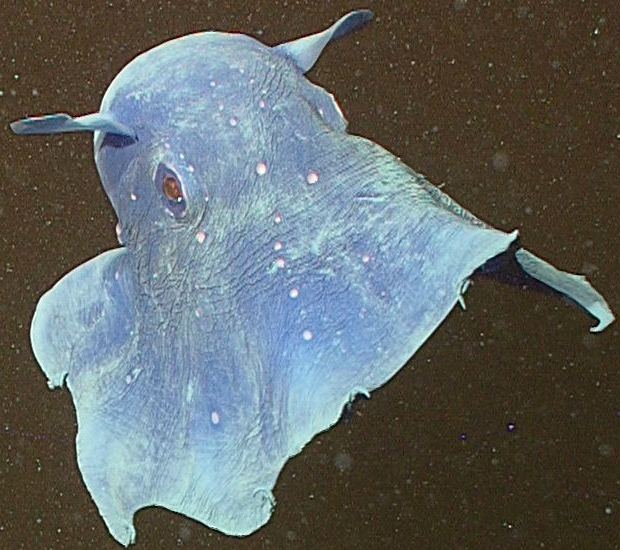

array([[[135, 115,  81],
        [133, 113,  79],
        [131, 110,  77],
        ...,
        [114,  94,  72],
        [113,  93,  71],
        [113,  93,  71]],

       [[139, 119,  85],
        [137, 116,  82],
        [134, 113,  80],
        ...,
        [115,  94,  72],
        [114,  94,  71],
        [113,  93,  70]],

       [[143, 123,  89],
        [141, 120,  86],
        [138, 117,  84],
        ...,
        [114,  95,  71],
        [114,  94,  71],
        [113,  93,  70]],

       ...,

       [[109, 104,  64],
        [110, 105,  65],
        [110, 105,  65],
        ...,
        [ 74,  74,  42],
        [ 73,  74,  42],
        [ 72,  73,  41]],

       [[107, 103,  63],
        [108, 104,  64],
        [108, 104,  65],
        ...,
        [ 73,  73,  41],
        [ 73,  73,  41],
        [ 72,  72,  41]],

       [[106, 103,  63],
        [106, 103,  63],
        [107, 103,  64],
        ...,
        [ 72,  72,  39],
        [ 72,  72,  40],
        [ 71,  72,  40]]], dtype=uint8)
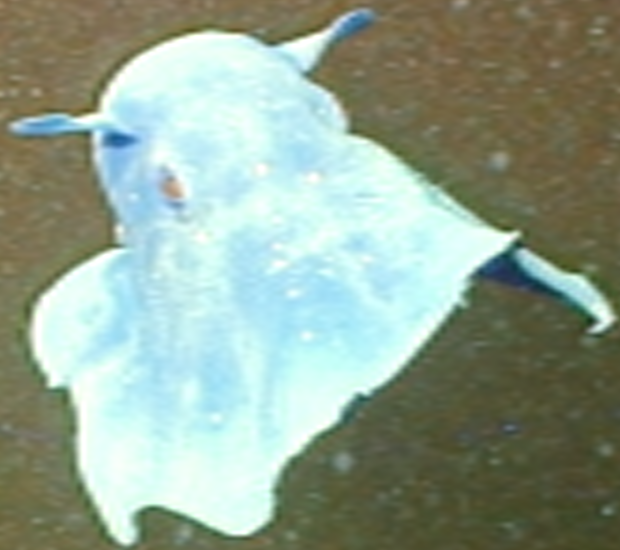

In [ ]:
fathomnet_dict_collection = []
for i in fathomnet_image_list:
  fathomnet_dict = {}
  fathomnet_dict['url'] = i.url
  fathomnet_dict['bounding_box'] = i.boundingBoxes
  fathomnet_dict['height'] = i.height
  fathomnet_dict['width'] = i.width
  fathomnet_dict_collection.append(fathomnet_dict)

cropped_elements = get_best_crops_from_sr_images(fathomnet_dict_collection, concept = CONCEPT)

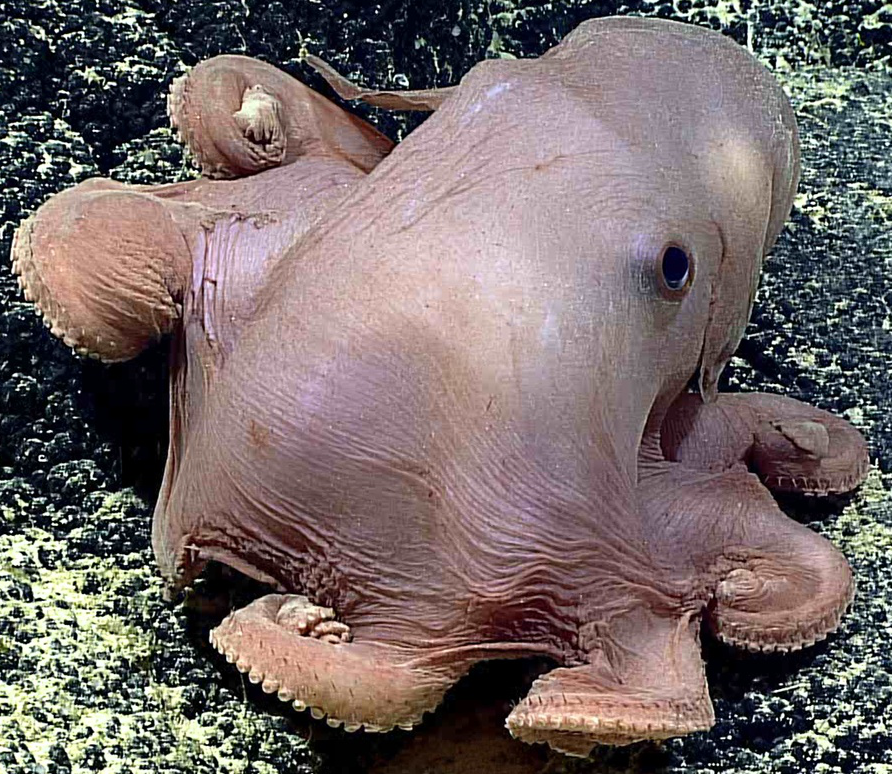

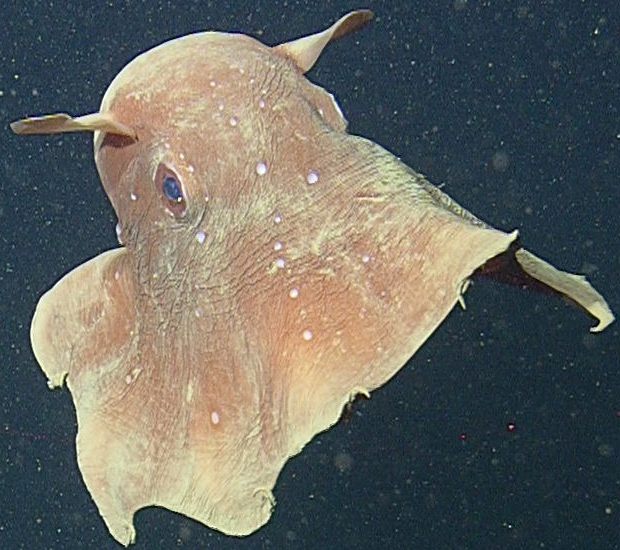

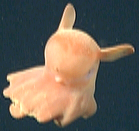

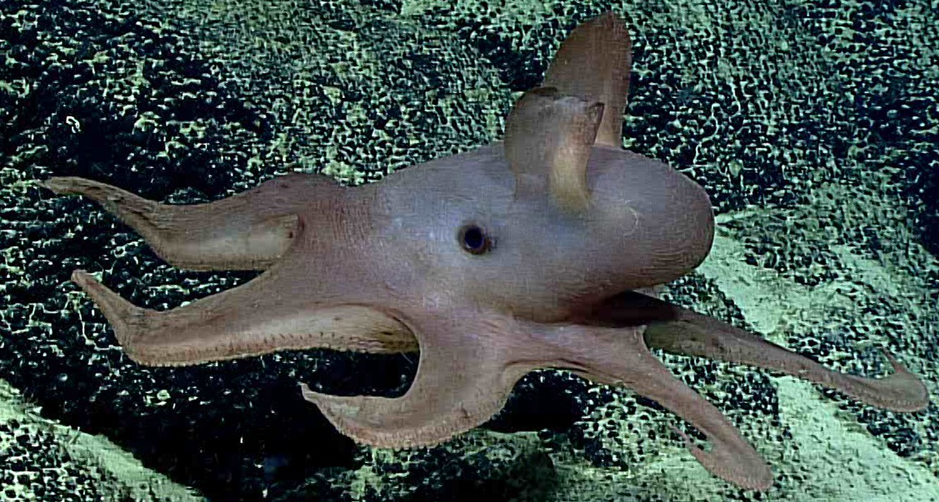

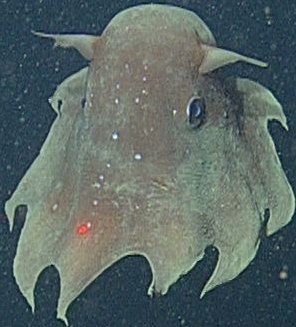

...

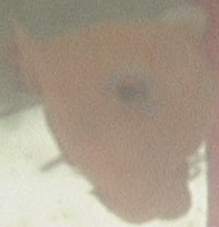

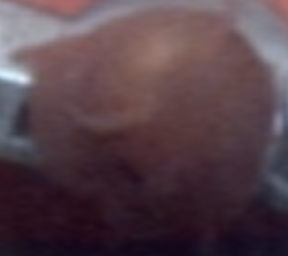

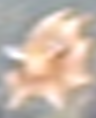

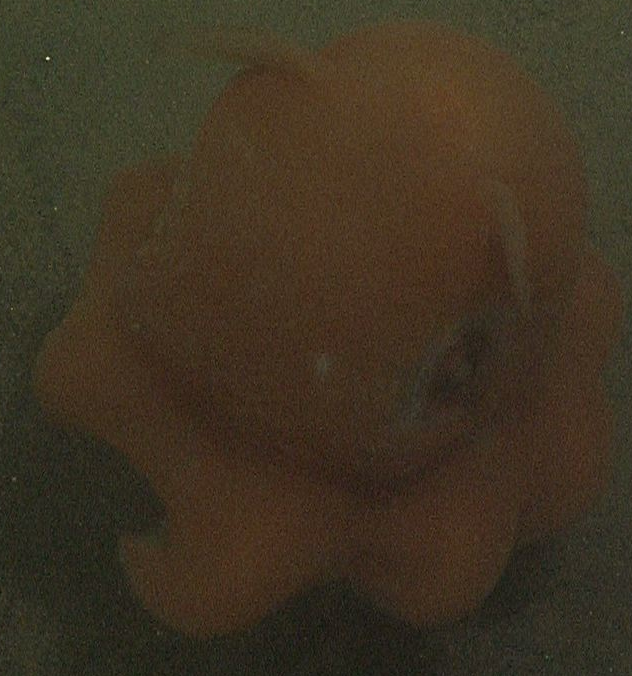

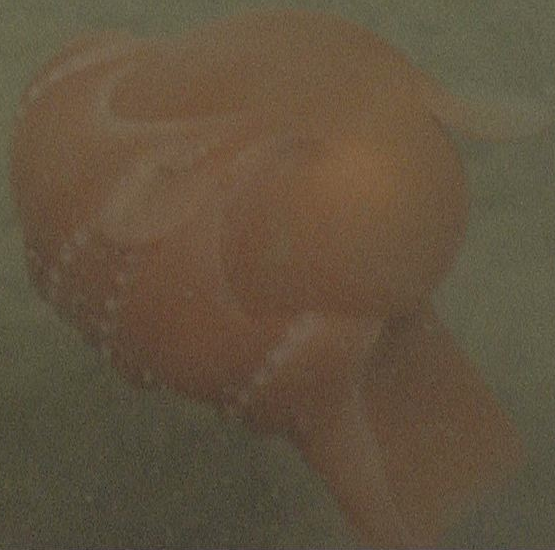

In [ ]:
for img in cropped_elements:
  display(Image.fromarray(img[1]))

In [ ]:
for img in cropped_elements:
  print(type(img[1]))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
